# Final project for HDEq Skills: 
`Due: Wednesday 3rd December 2025 @ 12:00 (noon)`

## Instruction and marking scheme

Your submission (like your assignments) will be a Jupyter Notebook (.ipynb file).  For your analysis and discussion use Markdown cells instead of comments in the code.

For the presentation and coding style:
- The plots should be in a good size, properly labelled and markers/lines wisely chosen. It might be a good idea to combine some plots and put several curves together for easier comparison and conciseness. 
- Your code should be well commented with meaningful variable names and good structures. You don't need to over comment it though!
- The writing should be clear and concise with minimal language or typing mistakes.


It is important that you think about good academic practice when you construct your answers. The work you submit must reflect **your own understanding**, in line with the School's policy on academic misconduct: https://teaching.maths.ed.ac.uk/undergraduate/studies/assessment/academic-misconduct and no generative AI is permitted. Any form of plagiarism or AI use that is detected by the software or markers will be reported to the school for the due process.

## Part 1: Wave equation with linear damping

Consider the following wave equation that includes a damping term


\begin{equation}
u_{tt} + \nu u_{t} = c^2 u_{xx}
\end{equation}

with the boundary conditions
\begin{equation}
u\left(x = 0, t\right) = 0 , \quad u\left(x = L, t\right) = 0,
\end{equation}
and the initial conditions
\begin{equation*}
u\left(x, t=0\right) = f(x) = \exp\left(\sin^2\left(\frac{2\pi x}{L}\right)\right)-1 , \quad u_t\left(x, t=0\right) = 0,
\end{equation*}

For this problem, let's set $L=20$, $\nu = 0.2$ and $c = 1$.

We use a method to solve this PDE that is known as "Galerkin". In so doing, we approximate the solution with

\begin{equation*}
u(x, t) \approx \sum_{n=1}^{N} f_n(t) \sin(\lambda_n x) 
\end{equation*}

and then derive an appropriate ODE for $f_n(t)$ to solve numerically. This is a form of separation of variables in which the equations for the functions of time are solved numerically rather than by hand. It can be shown that when $N \to \infty$ the above series converges to the exact solution. 

🚩 **Task 1.1 (1 mark)** Considering the above form of solution, find $\lambda_n$ in terms of $n$ and $L$. 

🚩 **Task 1.2 (1 mark)** Using the assumed form of solution and PDE, find an ODE that describes the evolution of $f_n(t)$ in time, (where $n = 1, 2, \dots, N $).

🚩 **Task 1.3 (2 marks)** Using the initial conditions of the PDE and your knowledge of Fourier series, find two initial conditions for $f_n$ and $\cfrac{df_n}{dt}$ at $t=0$. Your answer in this part might in the form of an integral, which you should not evaluate at this point (we will calculate this integral later numerically).

---------------
*use this cell for your answer*

### Task 1.1

From the boundary condition \(u(L,t)=0\), we require
$$
\sin(\lambda_n L) = 0 \quad \Rightarrow \quad \lambda_n L = n\pi.
$$

Therefore,
$$
\lambda_n = \frac{n\pi}{L}.
$$

### Task 1.2

Substituting the series into the PDE and using orthogonality of the sine functions gives
$$
f_n''(t) + \nu f_n'(t) + c^2 \lambda_n^2 f_n(t) = 0.
$$

Given C=1 and V=0.2, Final ODE is

$$
f_n''(t) + \ 0.2f_n'(t) + \lambda_n^2 f_n(t) = 0.
$$

### Task 1.3

The initial conditions for the coefficients are

$$
f_n(0) = \frac{2}{L} \int_{0}^{L}
f(x)\,\sin\left(\frac{n\pi x}{L}\right)\,dx,
$$

where  
$$
f(x) = \exp\left(\sin^2\left(\frac{2\pi x}{L}\right)\right)-1.
$$

Since \(u_t(x,0)=0\), the second initial condition is

$$
f_n'(0) = 0.
$$

🚩 **Task 1.4 (3 marks)** Write a function that takes $n$ (the index of the terms in the series solution, for example $n=3$ corresponds to $f_3(0)$) as an input and returns $f_n(0)$. You might solve this part using different tools: 1) `sympy` module or 2) direct numerical calculation using  `scipy.integrate` (see the documentation [here](https://docs.scipy.org/doc/scipy/reference/tutorial/integrate.html)). Make sure your final result is a numerical real value (not symbolic expressions). Remember from your labs that you can use `.N()` method to evaluate a sympy expression (if you decide to use `sympy`, which is not the only way to complete this task).

Once you have written your function, use it to calculate $f_n(0)$ for $L=20$, $n=7$ and the given initial condition $u(x, t=0) = \exp\left(\sin^2\left(\frac{2\pi x}{L}\right)\right)-1$.

In [1]:
import sympy as sym
import numpy as np
from scipy.integrate import quad

L = 20  # problem parameter
x = sym.symbols('x')

def calc_fn_0(k):
    
    # initial condition f(x) as a sympy expression
    f_expr = sym.exp(sym.sin(2*sym.pi*x/L)**2) - 1
    
    # turn it into a numerical function of x
    f_num = sym.lambdify(x, f_expr, 'numpy')
    
    # integrand for the Fourier sine coefficient
    integrand = lambda xx: f_num(xx) * np.sin(k*np.pi*xx/L)
    
    # numerical integration from 0 to L
    val, _ = quad(integrand, 0, L)
    
    return (2/L) * val

# compute f_7(0)
print("fn(0) = ", calc_fn_0(7))


fn(0) =  -0.15435719887903507


🚩 **Task 1.5 (4 marks)** Write a function to solve the ODEs that you derived in 'Task 1.2' for each $f_n(t)$. Your function takes $n$ (the index of terms in the solution series) and `t_vec` (the vector of times at which you want to have the solution). Then, it calculates the corresponding initial conditions ($f_n$ and $\cfrac{df}{dt}$ at $t=0$), solves the associated ODE and returns the solution at each point in `t_vec`. Use `odeint` to solve the ODE numerically. You may also use the function you wrote in the previous task.

Use the function to plot $f_1(t)$, $f_2(t)$ and $f_3(t)$ for `t_vec = np.linspace(0, 100, 1001)`.

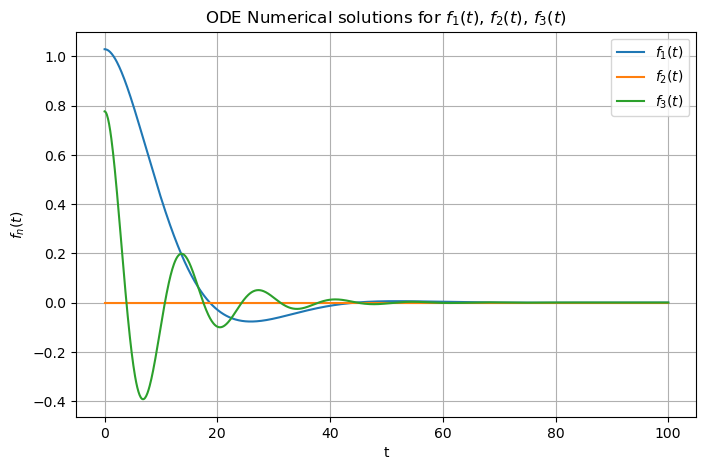

In [2]:
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# and this is the line in case the figure does not show up!
%matplotlib inline

nu = 0.2
c = 1
L = 20

def dF_dt(F, t, k):
    '''
    This function defines the RHS of the system of ODEs for f_k(t).
    F[0] = f_k(t), F[1] = f_k'(t)
    '''
    f = F[0]
    df = F[1]
    
    lambda_k = k * np.pi / L
    d2f = -nu * df - (c**2) * (lambda_k**2) * f
    
    return [df, d2f]

def fn_solve(k, t_vec):
    '''
    This function computes the solution f_k(t) for all the times in 't_vec'.
    'k' is the index of the term in the series solution.
    '''
    # initial conditions from Task 1.3 / 1.4
    f0 = calc_fn_0(k)
    df0 = 0.0
    
    F0 = [f0, df0]
    
    sol = odeint(dF_dt, F0, t_vec, args=(k,))
    
    # sol[:,0] is f_k(t), sol[:,1] is f_k'(t)
    return sol[:, 0]

# time vector
t_vec = np.linspace(0, 100, 1001)

# solve for k = 1, 2, 3
f1 = fn_solve(1, t_vec)
f2 = fn_solve(2, t_vec)
f3 = fn_solve(3, t_vec)

# plot
plt.figure(figsize=(8, 5))
plt.plot(t_vec, f1, label=r"$f_1(t)$")
plt.plot(t_vec, f2, label=r"$f_2(t)$")
plt.plot(t_vec, f3, label=r"$f_3(t)$")
plt.xlabel("t")
plt.ylabel(r"$f_n(t)$")
plt.title("ODE Numerical solutions for $f_1(t)$, $f_2(t)$, $f_3(t)$")
plt.legend()
plt.grid(True)
plt.show()

🚩 **Task 1.6 (4 marks)** Write a function that takes $N$ (the total number of terms in the sine series of the solution), `t_vec` and `x_vec` (which is the vector of points in space) as inputs and returns the solution $u(x,t)$ of the PDE at the times `t_vec` and points `x_vec`. Your function output should be a $N_T \times N_X$ numpy array, where $N_T$ is the number of points in time (i.e. the size of `t_vec`) and  $N_X$ is the number of points in space (i.e. the size of `x_vec`). Make good use of the functions you already wrote in the previous tasks.

With this function, find the solution for 

`x_vec = np.linspace(0, L, 201)`

`t_vec = np.linspace(0, 100, 1001)` 

`N =7`

Make an animation to show how $u(x,t)$ changes in time (each frame of animation is the solution at all spatial points but for one specific point in time)

In [3]:
def waveq_dam_solve(N, t_vec, x_vec):

    Nt = len(t_vec)
    Nx = len(x_vec)
    
    # initialise solution array
    u_x_t = np.zeros((Nt, Nx))
    
    # loop over modes
    for k in range(1, N+1):
        # time-dependent coefficient f_k(t)
        f_k_t = fn_solve(k, t_vec)   # length Nt
        lambda_k = k * np.pi / L
        
        # add contribution of this mode at all (t,x)
        for i in range(Nt):
            for j in range(Nx):
                u_x_t[i, j] += f_k_t[i] * np.sin(lambda_k * x_vec[j])
    
    return u_x_t



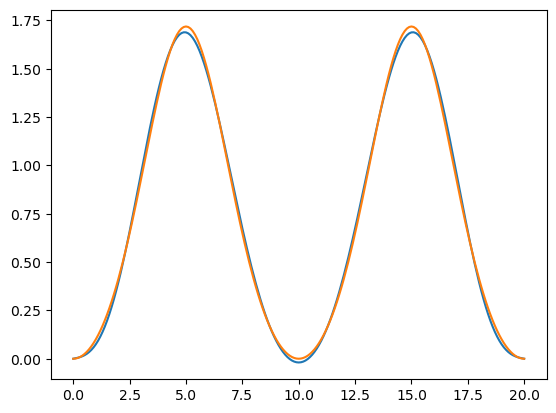

In [4]:
# Assuming the PDE's solution is stored in u_x_t[:,:], compared w/ approx solution at t=0 with the initial condition

x_vec = np.linspace(0, L, 201)
t_vec = np.linspace(0, 100, 1001)
N = 7

u_x_t = waveq_dam_solve(N, t_vec, x_vec)

plt.plot(x_vec, u_x_t[0,:])
plt.plot(x_vec,np.exp((np.sin(2*np.pi*x_vec/L))**2)-1)

In [5]:
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8,5))

# initial line at t = 0
line, = ax.plot(x_vec, u_x_t[0, :])
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.set_xlim(x_vec[0], x_vec[-1])
ax.set_ylim(u_x_t.min(), u_x_t.max())
ax.set_title("Damped wave solution")

# choose time indices to animate 
frames = np.arange(0, len(t_vec), 5)

#animate over data
def animate(i):
    line.set_ydata(u_x_t[i, :])  
    return line,

ani = animation.FuncAnimation(fig,animate,frames=frames,interval=25)

plt.close(fig)

HTML(ani.to_jshtml())

🚩 **Task 1.7 (2 marks)** Examine how the solution changes for different values of $N$. Consider $N=3$, $N=7$ and $N=11$. Show the animation of the solution for all the three cases in one plot and compare them with each other. Discuss and analyse your results (for example, are three terms enough to get an acceptable solution? What about seven?)

In [6]:
import matplotlib.animation as animation
from IPython.display import HTML

# compute solutions for different N
N1 = 3
N2 = 7
N3 = 11

u_x_t_3 = waveq_dam_solve(N1, t_vec, x_vec)
u_x_t_7 = waveq_dam_solve(N2, t_vec, x_vec)
u_x_t_11 = waveq_dam_solve(N3, t_vec, x_vec)

fig, ax = plt.subplots(figsize=(8,5))

# initial profiles at t = 0
line3, = ax.plot(x_vec, u_x_t_3[0, :], label="N = 3")
line7, = ax.plot(x_vec, u_x_t_7[0, :], label="N = 7")
line11, = ax.plot(x_vec, u_x_t_11[0, :], label="N = 11")

#plotting function
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.set_xlim(x_vec[0], x_vec[-1])
ax.set_ylim(
    min(u_x_t_3.min(), u_x_t_7.min(), u_x_t_11.min()),
    max(u_x_t_3.max(), u_x_t_7.max(), u_x_t_11.max()))

ax.set_title("Damped wave solution for different N")
ax.legend()

frames = np.arange(0, len(t_vec), 5)

#animation function
def animate(i):
    line3.set_ydata(u_x_t_3[i, :])
    line7.set_ydata(u_x_t_7[i, :])
    line11.set_ydata(u_x_t_11[i, :])
    return line3, line7, line11

ani = animation.FuncAnimation(fig,animate,frames=frames,interval=25)

plt.close(fig)

HTML(ani.to_jshtml())

Comparing the cases \(N=3\), \(N=7\) and \(N=11\) in the animation shows that
using only three modes gives a very smooth approximation that misses some of
the detail in the initial condition. Increasing to \(N=7\) improves the spatial
shape noticeably and the solution follows the expected damping behaviour. The
result for \(N=11\) is only slightly more accurate than for \(N=7\), suggesting
that around seven modes are already enough to capture the main features of the
solution.

🚩 **Task 1.8 (1 marks)** Change the damping parameter to $\nu = 2$, and repeat the 'task 1.6' (for $N=7$ and keep all other parameters the same). In few sentences, explain the changes caused by increasing the damping.

In [7]:
import matplotlib.animation as animation
from IPython.display import HTML


nu = 2     # increased damping
c = 1
L = 20

# recompute the solution for N = 7
x_vec = np.linspace(0, L, 201)
t_vec = np.linspace(0, 100, 1001)
N = 7

u_x_t_damped = waveq_dam_solve(N, t_vec, x_vec)

fig, ax = plt.subplots(figsize=(8,5))

#plotting function
line, = ax.plot(x_vec, u_x_t_damped[0, :])
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.set_xlim(x_vec[0], x_vec[-1])
ax.set_ylim(u_x_t_damped.min(), u_x_t_damped.max())
ax.set_title("Damped wave solution (ν = 2)")

frames = np.arange(0, len(t_vec), 10)

#animation function
def animate(i):
    line.set_ydata(u_x_t_damped[i, :])
    return line,

ani = animation.FuncAnimation(fig,animate,frames=frames,interval=20)

plt.close(fig)

HTML(ani.to_jshtml())

With the larger damping value (ν = 2), the oscillations decay much faster. Compared with the ν = 0.2 case, the solution loses amplitude quickly and the wave dies out after a short time.

## Part 2: Lorenz system


The Lorenz system is given by the coupled set of ODEs
\begin{equation}
  \frac{\mathrm{d}x}{\mathrm{d}t} = -\sigma x + \sigma y, \qquad
  \frac{\mathrm{d}y}{\mathrm{d}t} = x(\rho - z) - y, \qquad
  \frac{\mathrm{d}z}{\mathrm{d}t} = xy - \beta z,
\end{equation}
where ($\rho, \sigma, \beta$) are system parameters. Lorenz derived these equation as a simplified mathematical model for [atmospheric convection](https://en.wikipedia.org/wiki/Atmospheric_convection), which is an aspect of weather.  While the Lorenz system is deterministic, you will find in this problem that in certain sets of parameters there is sensitive dependence of the solution on the initial condition. Assuming this system is a representation of weather, small errors invariably arise (e.g. numerical discretisation, measurements inaccuracy), grow and affect long term solutions (cf. loss of predictability in weather forecasting). However, there are statistical properties (cf. the climatology) that may be robust and may be described accordingly.

--------------------
### Case of stable solution


Consider the parameters $\sigma = 10$, $\beta = 3$ and $\rho = 12$.


🚩 **Task 2.1 (1 mark)** Find all the critical points of this system


🚩 **Task 2.2 (2 marks)** Using a numerical method of your choice, find the solution starting from $x(t=0) = y(t=0) = z(t=0) = 10$ up to $t=20$. Plot the solution in *x-y*, *y-z* and *x-z* planes (so you need three plots). Where does this initial condition end up in? Can you express the exact location of this solution as $t \to \infty$? Make sure your timestep is small enough to have robust results. You can check this by running your code for several different timesteps.

In [8]:
# Task 2.1 – find critical points using the ODE function
import sympy as sym
sym.init_printing()
from IPython.display import display

# parameters
rho = 12
sigma = 10
beta = 3

x, y, z = sym.symbols('x y z')

# functions
f1 = -sigma*x + sigma*y
f2 = x*(rho - z) - y
f3 = x*y - beta*z

# solving for critical points
critical_points = sym.solve([f1, f2, f3], [x, y, z])

print("The three critical points are:")

display(critical_points)

The three critical points are:


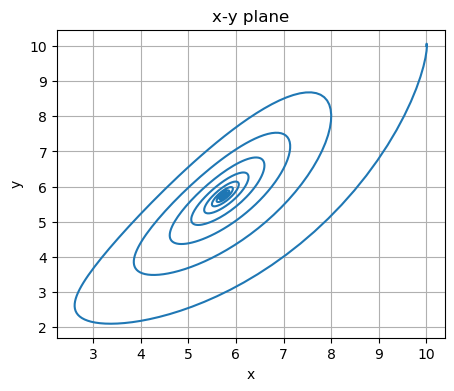

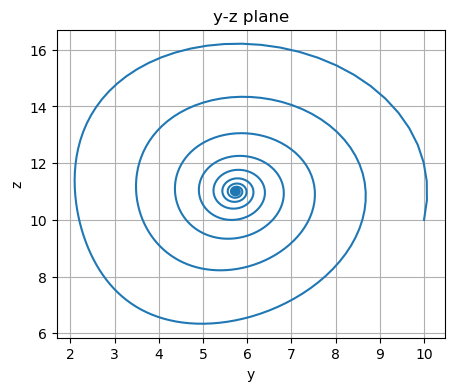

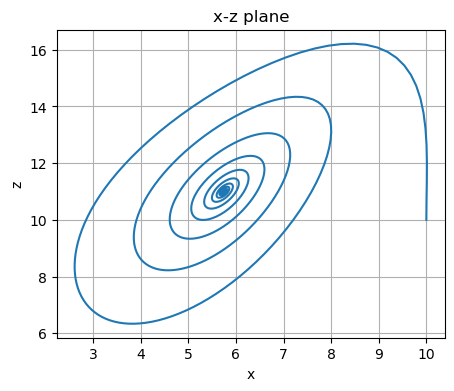

In [9]:
# Task 2.2
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

rho = 12.0
sigma = 10.0
beta = 3.0

# Lorenz function
def lorenz(F, t):
    x = F[0]
    y = F[1]
    z = F[2]

    dxdt = -sigma * x + sigma * y
    dydt = x * (rho - z) - y
    dzdt = x * y - beta * z

    return [dxdt, dydt, dzdt]

# time
t0 = 0
t_end = 20
Nt = 2001
t_vec = np.linspace(t0, t_end, Nt)

# initial condition
F0 = [10.0, 10.0, 10.0]

# solve
sol = odeint(lorenz, F0, t_vec)

x = sol[:,0]
y = sol[:,1]
z = sol[:,2]

# x-y plot
plt.figure(figsize=(5,4))
plt.plot(x, y)
plt.xlabel("x")
plt.ylabel("y")
plt.title("x-y plane")
plt.grid(True)
plt.show()

# y-z plot
plt.figure(figsize=(5,4))
plt.plot(y, z)
plt.xlabel("y")
plt.ylabel("z")
plt.title("y-z plane")
plt.grid(True)
plt.show()

# x-z plot
plt.figure(figsize=(5,4))
plt.plot(x, z)
plt.xlabel("x")
plt.ylabel("z")
plt.title("x-z plane")
plt.grid(True)
plt.show()

As $t \to \infty$, the solution tends towards the critical point $(x, y, z) = (\sqrt{33},\, \sqrt{33},\, 11)$.

🚩 **Task 2.3 (4 marks)** Consider two different numerical methods: forward Euler and Ruge-kutta (4th order) methods. Set the initial condition to $x = y = z = 100$ and the final time to 0.3. The Ruge-kutta method with timestep h=10^{-6} is accurate enough that **we can regard it as an exact solution**. Using this *estimate numerically* the **global error** for variable $x$ and plot it in log-scale as a function of timestep. In so doing, consider the values `[0.002, 0.001, .0005, 0.0002, 0.0001]` for timesteps. 

Note that the order of error can be estimated from the slope of plots in log-scales. If a function is proportional to $h^{6}$, then in log-scale it looks linear and have the slope of $6$.

What is the slope of global error vs timestep for each method? Why do you get these slopes? You can estimate the slopes by drawing linear guidelines. For example, if you draw $h^{6}$ and your curve is close to this guideline, then you can conclude that the slope is close to $6$. You need to shift your guidelines up and down to bring them closer to the results of numerical solutions. Are the results different than the slopes you expect for the local error as a function of timestep? Can you reason why?


(Remember that you have already implemented forward Euler and Ruge-kutta in your lab notebooks. There is also something called "copy-paste".)

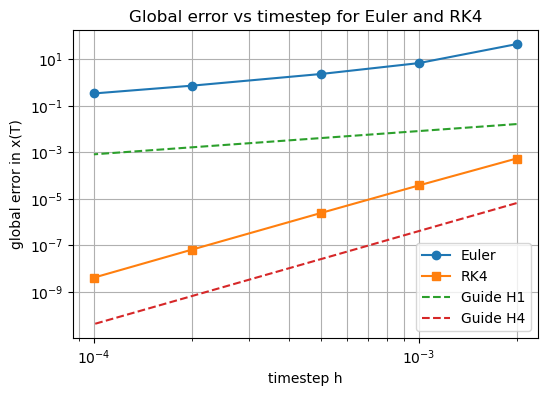

In [10]:
### BEGIN SOLUTION
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

# Runge-Kutta 4 scheme
def ode_RK4(func, times, y0):
    times = np.array(times)
    y0 = np.array(y0)
    n = y0.size       # the dimension of ODE 
    nT = times.size   # the number of time steps 
    y = np.zeros([nT, n])
    y[0, :] = y0
    for k in range(nT-1):
        dt = times[k+1] - times[k]
        f1 = np.array(func(y[k, :], times[k]))
        f2 = np.array(func(y[k, :] + 0.5*dt*f1, times[k] + 0.5*dt))
        f3 = np.array(func(y[k, :] + 0.5*dt*f2, times[k] + 0.5*dt))
        f4 = np.array(func(y[k, :] + dt*f3,     times[k] + dt))
        y[k+1, :] = y[k, :] + dt/6.0*(f1 + 2*f2 + 2*f3 + f4)
    return y 


# Euler scheme
def ode_Euler(func, times, y0):
    times = np.array(times)
    y0 = np.array(y0)
    n = y0.size       # the dimension of ODE 
    nT = times.size   # the number of time steps 
    y = np.zeros([nT, n])
    y[0, :] = y0
    # loop for timesteps
    for k in range(nT-1):
        dt = times[k+1] - times[k]
        f_val = np.array(func(y[k, :], times[k]))
        y[k+1, :] = y[k, :] + dt * f_val
    return y



# initial condition and final time
y0 = np.array([100.0, 100.0, 100.0])
t0 = 0.0
t_end = 0.3

# referencing solution using RK4 with h = 1e-6
h_ref = 1e-6
n_ref = int((t_end - t0)/h_ref)
times_ref = np.linspace(t0, t_end, n_ref + 1)
y_ref = ode_RK4(lorenz, times_ref, y0)
x_ref = y_ref[-1, 0]

# timesteps to test
h_list = np.array([0.002, 0.001, 0.0005, 0.0002, 0.0001])

euler_err = np.zeros(len(h_list))
rk4_err = np.zeros(len(h_list))

for i, h in enumerate(h_list):
    # creating time grid for this step size
    n_steps = int((t_end - t0)/h)
    times = np.linspace(t0, t_end, n_steps + 1)
    
    # Forward Euler
    y_euler = ode_Euler(lorenz, times, y0)
    x_euler_T = y_euler[-1, 0]
    euler_err[i] = abs(x_euler_T - x_ref)
    
    # RK4
    y_rk4 = ode_RK4(lorenz, times, y0)
    x_rk4_T = y_rk4[-1, 0]
    rk4_err[i] = abs(x_rk4_T - x_ref)

h_1=8*h_list**1
h_4=4e5*h_list**4

# plot global error vs timestep (log-log)
plt.figure(figsize=(6,4))
plt.loglog(h_list, euler_err, 'o-', label="Euler")
plt.loglog(h_list, rk4_err, 's-', label="RK4")
plt.loglog(h_list, h_1, '--', label="Guide H1")
plt.loglog(h_list, h_4, '--', label="Guide H4")
plt.xlabel("timestep h")
plt.ylabel("global error in x(T)")
plt.title("Global error vs timestep for Euler and RK4")
plt.grid(True, which="both")
plt.legend()
plt.show()



In the log–log plot of global error versus timestep, the curve for Euler’s
method aligns closely with a straight line of slope ≈ 1. Likewise, the curve
corresponding to the RK4 method follows a line with slope ≈ 4. The positive
slopes indicate that the numerical error decreases as the timestep becomes
smaller, which is expected since finer steps produce more accurate
approximations.

The difference between the two slopes reflects the difference in the order of
accuracy of the methods. Euler’s method is a first–order scheme, so its global
error is proportional to \(h^1\). In contrast, the RK4 method is fourth–order,
requiring four function evaluations per step, giving it a global error that
scales like \(h^4\). This explains why the RK4 line in the log–scale plot is
much steeper than the Euler line.

These observations differ from what one would see when analysing local errors.
Local truncation errors for Euler and RK4 scale like \(h^2\) and \(h^5\),
respectively. However, the global error accumulates over many steps, reducing
the power of \(h\) by one. As a result, the global error slopes match the
expected orders of the full methods rather than the orders of their local
errors.

--------------------
### Case of chaotic behaviour and strange attractor


Consider the set of parameters $\sigma = 10$, $\beta = 8/3$ and $\rho = 28$ and stick to Runge-Kutta scheme with timestep of $h = 10^{-4}$ for this part. 

**Task 2.4 (2 marks)** Draw the three-dimensional phase portraits using $x = y = z = 1$ as initial condition. You can use the script below to plot 3D curves.


**Task 2.5 (3 marks)** Change the initial condition as $x = 1 + \epsilon, y = 1, z = 1$, where $\epsilon$ is $10^{-1}$, $10^{-5}$ and $10^{-12}$. Draw the phase portrait for each initial condition and compare it to what you got for Task 2.4. Do they look different? Representing the outputs of these new solutions (with new initial conditions) with $x_1$, $y_1$ and $z_1$ and the solution starting from $x = y = z = 1$ with $x^*$, $y^*$ and $z^*$, compute a measure of difference between these solutions given by
  
\begin{equation*}
\mathcal{e}(t) = \sqrt{(x^*(t) - x_1(t))^2 +  (y^*(t) - y_1(t))^2 + (z^*(t) - z_1(t))^2}.
\end{equation*}
  
Plot the time-series diagrams of $\mathcal{e}(t)$ for three different values of $\epsilon$. From the behaviour of $\mathcal{e}(t)$ answer the following questions:

- If two initial conditions are very close, do their corresponding trajectories stay close to each other in time? 

- Do you see an upper bound for $\mathcal{e}(t)$? What does this imply?
  
  
*The moral of the story is that the exact realisations (the "weather") can have sensitive dependence on initial conditions, and in reality errors always exist, so loss of accuracy in weather prediction is fairly rapid. However there are gross features that remain roughly invariant and can be described, for example the butterfly attractor that you see in your results (the "climate").*

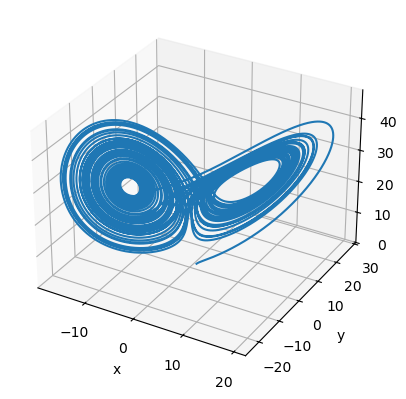

In [12]:
# Task 2.4
from mpl_toolkits.mplot3d import Axes3D

# set chaotic parameters
sigma = 10.0
beta = 8.0/3.0
rho = 28.0

# time setup
t0 = 0.0
t_end = 50.0  
h = 1e-4
n_steps = int((t_end - t0)/h)
times = np.linspace(t0, t_end, n_steps + 1)

# initial condition
y0 = [1.0, 1.0, 1.0]

# solve Lorenz system
sol = ode_RK4(lorenz, times, y0)
x = sol[:, 0]
y = sol[:, 1]
z = sol[:, 2]

# 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(x, y, z)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
plt.show()

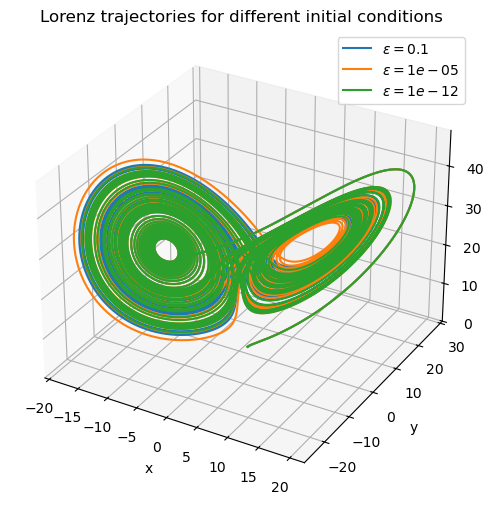

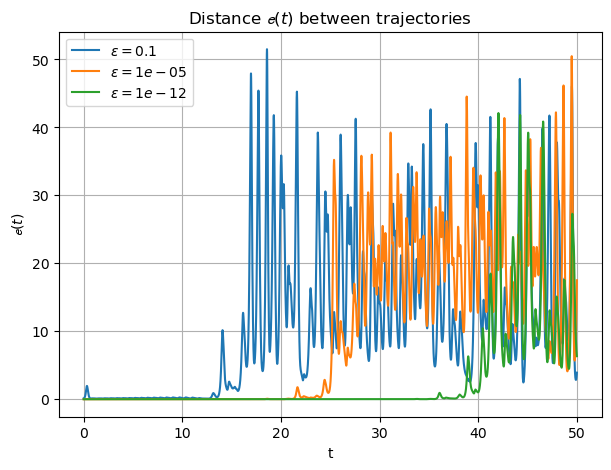

In [13]:
# Task 2.5 
from mpl_toolkits.mplot3d import Axes3D

# time setup 
t0 = 0.0
t_end = 50.0
h = 1e-4
n_steps = int((t_end - t0) / h)
times = np.linspace(t0, t_end, n_steps + 1)

# base initial condition
y0_star = np.array([1.0, 1.0, 1.0])
sol_star = ode_RK4(lorenz, times, y0_star)
x_star = sol_star[:, 0]
y_star = sol_star[:, 1]
z_star = sol_star[:, 2]

# perturbed initial conditions
eps_list = [1e-1, 1e-5, 1e-12]
sol_eps = []

for eps in eps_list:
    y0_eps = np.array([1.0 + eps, 1.0, 1.0])
    sol_eps.append(ode_RK4(lorenz, times, y0_eps))



#3D phase portrait 
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(111, projection='3d')


# perturbed trajectories
for eps, sol in zip(eps_list, sol_eps):
    ax.plot(sol[:,0], sol[:,1], sol[:,2], label=fr"$\epsilon = {eps}$")

ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_title("Lorenz trajectories for different initial conditions")
ax.legend()
plt.show()


# 2)e(t) plot
plt.figure(figsize=(7,5))

for eps, sol in zip(eps_list, sol_eps):
    x1 = sol[:,0]
    y1 = sol[:,1]
    z1 = sol[:,2]
    e_t = np.sqrt((x_star - x1)**2 + (y_star - y1)**2 + (z_star - z1)**2)
    plt.plot(times, e_t, label=fr"$\epsilon = {eps}$")

plt.xlabel("t")
plt.ylabel(r"$\mathcal{e}(t)$")
plt.grid(True)
plt.title(r"Distance $\mathcal{e}(t)$ between trajectories")
plt.legend()
plt.show()

### Discussion for Task 2.5

From the time–series plots of $\mathcal{e}(t)$ for the three values of
$\epsilon$, we see that even when the initial conditions differ by an extremely
small amount, the difference between the corresponding trajectories does not
stay small: after an initial period, $\mathcal{e}(t)$ grows rapidly. This shows
that nearby initial conditions diverge in time.

Although the trajectories separate quickly, $\mathcal{e}(t)$ does not grow
without bound. Instead, it settles at a value of order one. This means that
while the solutions diverge from each other, they remain confined to the same
bounded region in phase space. 